# Shift mapping

This tutorial demonstrates...

Assume psf region and kernel maps already built

## Run photometry

In [1]:
import numpy as np
from pathlib import Path
from astropy.io import fits
from pathlib import Path
from astropy.io import fits
from mophongo.psf_map import PSFRegionMap
from mophongo.fit import FitConfig
from mophongo.catalog import Catalog
from mophongo import pipeline

data_dir = Path('../data')
#field = 'uds-test'
field = 'uds-medium'
#field = 'uds-large'
sci_444 = data_dir / f'{field}-f444w_sci.fits'
wht_444 = data_dir / f'{field}-f444w_wht.fits'

prm_kern = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_kernel_f770w.geojson'))
prm_444 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_psf.geojson'))
prm_770 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f770w_psf.geojson'))

# MIRI images
img_770 = fits.getdata(data_dir / f'{field}-f770w_sci.fits')
wht_770 = fits.getdata(data_dir / f'{field}-f770w_wht.fits')

# read in LW selected catalog
seg_LW = data_dir / f'{field}-LW_seg.fits'
cat444 = Catalog.from_fits(sci_444, wht_444, segmap=seg_LW, estimate_ivar=True)
cat770 = Catalog.from_fits(img_770, wht_770, segmap=seg_LW, estimate_ivar=True) 

residual = [None, None, None, None]

/Users/ivo/Astro/PROJECTS/MOPHONGO/mophongo/mophongo/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Measuring inverse variance map...
Measuring inverse variance map...


/Users/ivo/Astro/PROJECTS/MOPHONGO/mophongo/mophongo/src/mophongo/catalog.py:344: RuntimeWarning: divide by zero encountered in divide
  error=np.sqrt(1.0 / self.ivar),
/Users/ivo/Astro/PROJECTS/MOPHONGO/mophongo/mophongo/src/mophongo/catalog.py:344: RuntimeWarning: overflow encountered in divide
  error=np.sqrt(1.0 / self.ivar),
/Users/ivo/Astro/PROJECTS/MOPHONGO/mophongo/mophongo/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/ivo/Astro/PROJECTS/MOPHONGO/mophongo/mophongo/src/mophongo/catalog.py:351: RuntimeWarning: divide by zero encountered in divide
  self.table['sharpness'] =  (self.catalog.max_value * np.pi * self.table['r50']**2 / self.catalog.segment_flux).value


### Separate flux and astrometric fit

First fit fluxes, then astrometric shift field, iterate.

In [2]:
# test astrometry fit vs number of iterations for separate astro + flux fits
config = FitConfig(fit_astrometry_niter=3,
                    fit_astrometry_joint=False,
                    astrom_basis_order=2,
                    reg_astrom=1e-4,
                    snr_thresh_astrom=10.0)
table1, res1, fit1 = pipeline.run([cat444.sci, cat770.sci],
                                cat444.segmap.data,
                                weights=[cat444.ivar, cat770.ivar],
                                catalog=cat444.table,  
                                psfs=[prm_444, prm_770],
                                kernels=[None, prm_kern],
                                wcs=[cat444.wcs] * 2,
                                config=config)
residual[1] = res1[0]
fits.writeto('residual_separate.fits', data=residual[1], overwrite=True)
fits.writeto('model_separate.fits', data=cat770.sci-residual[1], overwrite=True)



The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    
The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       config_testbed      imagefindpars           mapreg       
       photeq            pixreplace           pixtopix            pixtosky      
  refimagefindpars       resetbits          runastrodriz          skytopix      
     tweakback            tweakreg           updatenpol
Pipeline (start) memory: 1.3 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fit_astrometry_niter=3, astrom_basis_order=2, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='polynomial', multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False)


Extracting templates: 100%|██████████| 3899/3899 [00:01<00:00, 3536.77it/s]


Pipepline: 3891 extracted templates, dropped 8.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-medium-f444w_kernel_f770w
Pruned 390 templates outside weight map


Convolving templates: 100%|██████████| 3501/3501 [00:32<00:00, 109.27it/s]


Pipeline (convolved) memory: 1.6 GB
Running iteration 1 of 3
Dropped 147 templates with low norm.
0 NaN norms found.


Building Normal matrix: 100%|██████████| 3354/3354 [00:03<00:00, 897.86it/s] 


Pipeline (residual) memory: 1.7 GB
fitting astrometry separately
Dropped 0 templates with low norm.
0 NaN norms found.


Building Normal matrix: 100%|██████████| 3354/3354 [00:03<00:00, 910.99it/s] 


Running iteration 2 of 3
Dropped 146 templates with low norm.
0 NaN norms found.


Building Normal matrix: 100%|██████████| 3355/3355 [00:03<00:00, 906.78it/s] 


Pipeline (residual) memory: 1.9 GB
fitting astrometry separately
Dropped 0 templates with low norm.
0 NaN norms found.


Building Normal matrix: 100%|██████████| 3355/3355 [00:03<00:00, 882.95it/s] 


Running iteration 3 of 3
Dropped 146 templates with low norm.
0 NaN norms found.


Building Normal matrix: 100%|██████████| 3355/3355 [00:03<00:00, 873.11it/s] 


Pipeline (residual) memory: 1.9 GB
fitting astrometry separately
Dropped 0 templates with low norm.
0 NaN norms found.


Building Normal matrix: 100%|██████████| 3355/3355 [00:03<00:00, 887.34it/s] 


Distribution >99% chi2: [2.3746498]
Adding 20 new templates for poor fits (chi^2/nu > 5.0)
Dropped 146 templates with low norm.
0 NaN norms found.


Building Normal matrix: 100%|██████████| 3355/3355 [00:03<00:00, 885.25it/s] 


Done...
Pipeline (end) memory: 1.9 GB


In [9]:
import numpy as np
np.isnan(cat444.sci).any(),np.isnan(cat770.sci).any(),


(np.False_, np.False_)

In [ ]:
fit1.templates[0].shift
import numpy as np

# shape = (ny, nx) of the image
ny, nx, step = *cat444.sci.shape, 15
yg, xg = np.mgrid[step:ny:step, step:nx:step]
positions = np.column_stack([xg.ravel(), yg.ravel()])
dx_grid, dy_grid = shifts_at_positions(positions, coeff_x, coeff_y, order, shape)
dx_grid = dx_grid.reshape(x_grid.shape)
dy_grid = dy_grid.reshape(y_grid.shape)

# For GP field:
# dx_grid = gp_x.predict(positions)
# dy_grid = gp_y.predict(positions)
# dx_grid = dx_grid.reshape(x_grid.shape)
# dy_grid = dy_grid.reshape(y_grid.shape)

# Now plot (example):
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 8))
plt.imshow(image, origin='lower', cmap='gray', alpha=0.5)
plt.quiver(x_grid, y_grid, dx_grid, dy_grid, color='red', angles='xy', scale=1)
plt.title("Astrometric Shift Field")
plt.xlabel("X")
plt.ylabel("Y")
plt.tight_layout()
plt.show()

array([ 0.64593763, -1.25556724])

In [8]:
ny, nx, step = *cat444.sci.shape, 20

yg, xg = np.mgrid[10:ny:step, 10:nx:step]
xg

array([[  10,   30,   50, ..., 3450, 3470, 3490],
       [  10,   30,   50, ..., 3450, 3470, 3490],
       [  10,   30,   50, ..., 3450, 3470, 3490],
       ...,
       [  10,   30,   50, ..., 3450, 3470, 3490],
       [  10,   30,   50, ..., 3450, 3470, 3490],
       [  10,   30,   50, ..., 3450, 3470, 3490]], shape=(126, 175))

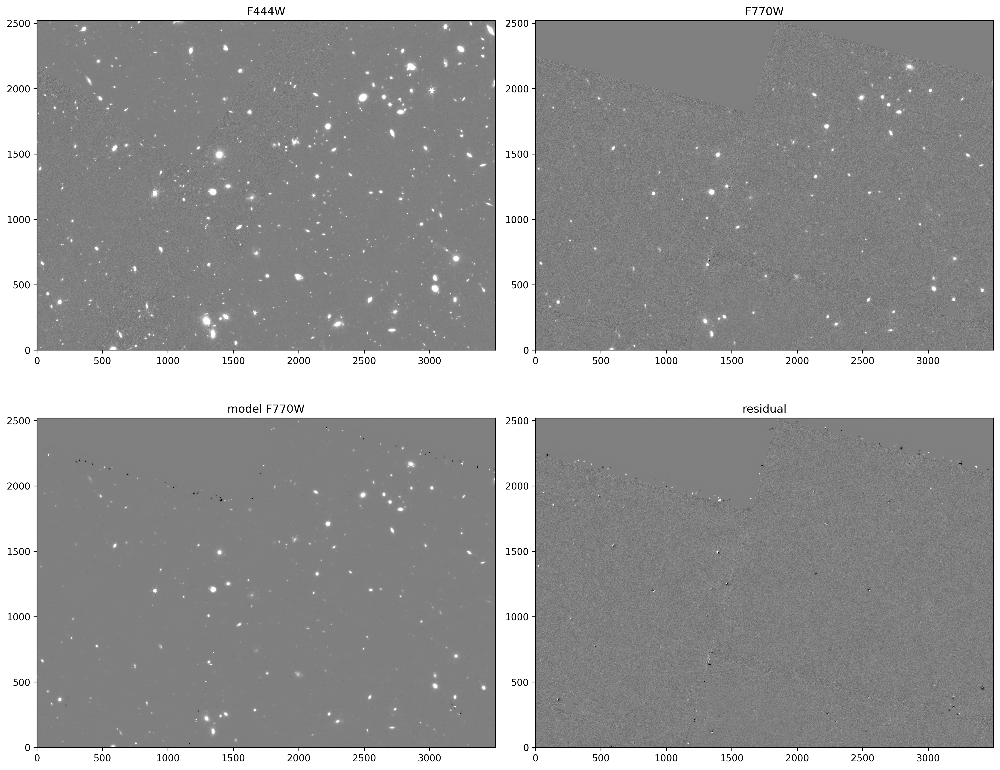

In [3]:
from matplotlib import pyplot as plt
img = [cat444.sci*10, cat770.sci, cat770.sci - residual[1], residual[1]] 
titles = ['F444W', 'F770W', 'model F770W', 'residual']
fig, ax = plt.subplots(2, 2, figsize=(15, 12))
ax = ax.flatten()
for i in range(4):
    ax[i].imshow(img[i], origin='lower', cmap='gray', vmin=-3, vmax=3)
    ax[i].set_title(f'{titles[i]}')
plt.tight_layout() 